In [1]:
!nvidia-smi

Wed Apr  2 16:21:43 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   43C    P8              9W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [2]:
import os
HOME = os.getcwd()
print(HOME)

/content


## Install YOLOv8

YOLOv8 can be installed in two ways - from the source and via pip. This is because it is the first iteration of YOLO to have an official package.

In [3]:
"""!pip install --upgrade numpy
!pip uninstall -y ultralytics
!pip install ultralytics

# Restart the kernel to apply the changes
import os
os._exit(00)"""

'!pip install --upgrade numpy\n!pip uninstall -y ultralytics\n!pip install ultralytics\n\n# Restart the kernel to apply the changes\nimport os\nos._exit(00)'

In [4]:
from ultralytics import YOLO

from IPython.display import display, Image

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


## CLI Basics

If you want to train, validate or run inference on models and don't need to make any modifications to the code, using YOLO command line interface is the easiest way to get started. Read more about CLI in [Ultralytics YOLO Docs](https://docs.ultralytics.com/usage/cli/).

```
yolo task=detect    mode=train    model=yolov8n.yaml      args...
          classify       predict        yolov8n-cls.yaml  args...
          segment        val            yolov8n-seg.yaml  args...
                         export         yolov8n.pt        format=onnx  args...
```

## Inference with Pre-trained COCO Model

### 💻 CLI

`yolo mode=predict` runs YOLOv8 inference on a variety of sources, downloading models automatically from the latest YOLOv8 release, and saving results to `runs/predict`.

In [5]:
%cd {HOME}
!yolo task=detect mode=predict model=yolov8n.pt conf=0.25 source='https://media.roboflow.com/notebooks/examples/dog.jpeg' save=True

/content
100% 6.25M/6.25M [00:00<00:00, 387MB/s]
Ultralytics 8.3.100 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv8n summary (fused): 72 layers, 3,151,904 parameters, 0 gradients, 8.7 GFLOPs

100% 104k/104k [00:00<00:00, 78.2MB/s]
image 1/1 /content/dog.jpeg: 640x384 1 person, 1 car, 1 dog, 38.5ms
Speed: 14.5ms preprocess, 38.5ms inference, 348.1ms postprocess per image at shape (1, 3, 640, 384)
Results saved to runs/detect/predict
💡 Learn more at https://docs.ultralytics.com/modes/predict


### 🐍 Python SDK

The simplest way of simply using YOLOv8 directly in a Python environment.

In [7]:
model = YOLO(f'{HOME}/yolov8n.pt')
results = model.predict(source='https://media.roboflow.com/notebooks/examples/dog.jpeg', conf=0.25)


Found https://media.roboflow.com/notebooks/examples/dog.jpeg locally at dog.jpeg
image 1/1 /content/dog.jpeg: 640x384 1 person, 1 car, 1 dog, 46.6ms
Speed: 2.6ms preprocess, 46.6ms inference, 192.1ms postprocess per image at shape (1, 3, 640, 384)


In [8]:
results[0].boxes.xyxy

tensor([[   0.0000,  314.4717,  625.0754, 1278.1946],
        [  55.1731,  250.0220,  648.1080, 1266.2720],
        [ 633.2291,  719.5391,  701.0538,  786.0336]], device='cuda:0')

In [9]:
results[0].boxes.conf

tensor([0.7271, 0.2907, 0.2846], device='cuda:0')

In [10]:
results[0].boxes.cls

tensor([ 0., 16.,  2.], device='cuda:0')

In [11]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="DNEb3p0rRR4dY7VB3dZl")
project = rf.workspace("freshness-detection-vwn1a").project("freshness-detection-rhrze")
version = project.version(3)
dataset = version.download("yolov8")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.5/84.5 kB 7.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 6.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 14.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 112.2 MB/s eta 0:00:00
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.11.0.86
    Uninstalling opencv-python-headless-4.11.0.86:
      Successfully uninstalled opencv-python-headless-4.11.0.86
  Attempting uninstall: idna
    Found existing installation: idna 3.10
    Uninstalling idna-3.10:
      Successfully uninstalled idna-3.10


loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to freshness-detection-3 in yolov8:: 100%|██████████| 42308/42308 [00:06<00:00, 6795.59it/s]


In [15]:
yaml_path = f"{dataset.location}/data.yaml"

try:
    with open(yaml_path, "r") as file:
        yaml_contents = file.read()
        print(yaml_contents)
except FileNotFoundError:
    print(f"Error: data.yaml file not found at {yaml_path}")


names:
- fresh apple
- fresh banana
- fresh bell pepper
- fresh carrot
- fresh cucumber
- fresh mango
- fresh orange
- fresh potato
- fresh strawberry
- fresh tomato
- rotten apple
- rotten banana
- rotten bell pepper
- rotten carrot
- rotten cucumber
- rotten mango
- rotten orange
- rotten potato
- rotten strawberry
- rotten tomato
nc: 20
roboflow:
  license: CC BY 4.0
  project: freshness-detection-rhrze
  url: https://universe.roboflow.com/freshness-detection-vwn1a/freshness-detection-rhrze/dataset/3
  version: 3
  workspace: freshness-detection-vwn1a
test: ../test/images
train: ../train/images
val: ../valid/images



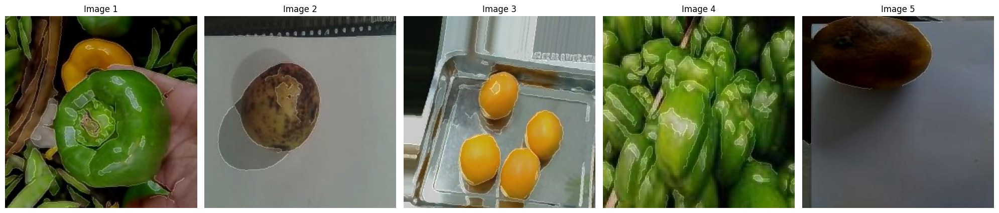

In [17]:
import random
import matplotlib.pyplot as plt
import cv2
import glob

# Load images from the correct dataset location
image_paths = glob.glob(f"{dataset.location}/train/images/*.jpg")

if len(image_paths) < 5:
    print(f"Error: Found only {len(image_paths)} images! Check dataset location.")
else:
    # Select 5 random images
    random_images = random.sample(image_paths, 5)

    # Display images in a grid
    fig, axes = plt.subplots(1, 5, figsize=(20, 5))

    for i, img_path in enumerate(random_images):
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB

        # Apply mild edge enhancement
        img_blur = cv2.GaussianBlur(img, (5, 5), 0)
        edges = cv2.Canny(img_blur, 50, 150)
        img = cv2.addWeighted(img, 0.8, cv2.cvtColor(edges, cv2.COLOR_GRAY2RGB), 0.2, 0)

        axes[i].imshow(img)
        axes[i].axis("off")
        axes[i].set_title(f"Image {i+1}")

    plt.tight_layout()
    plt.show()


## Custom Training

In [18]:
%cd {HOME}

!yolo task=detect mode=train model=yolov8s.pt data={dataset.location}/data.yaml epochs=35 imgsz=225 plots=True

/content
100% 21.5M/21.5M [00:00<00:00, 245MB/s]
Ultralytics 8.3.100 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=/content/freshness-detection-3/data.yaml, epochs=35, time=None, patience=100, batch=16, imgsz=225, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=Fals

/content


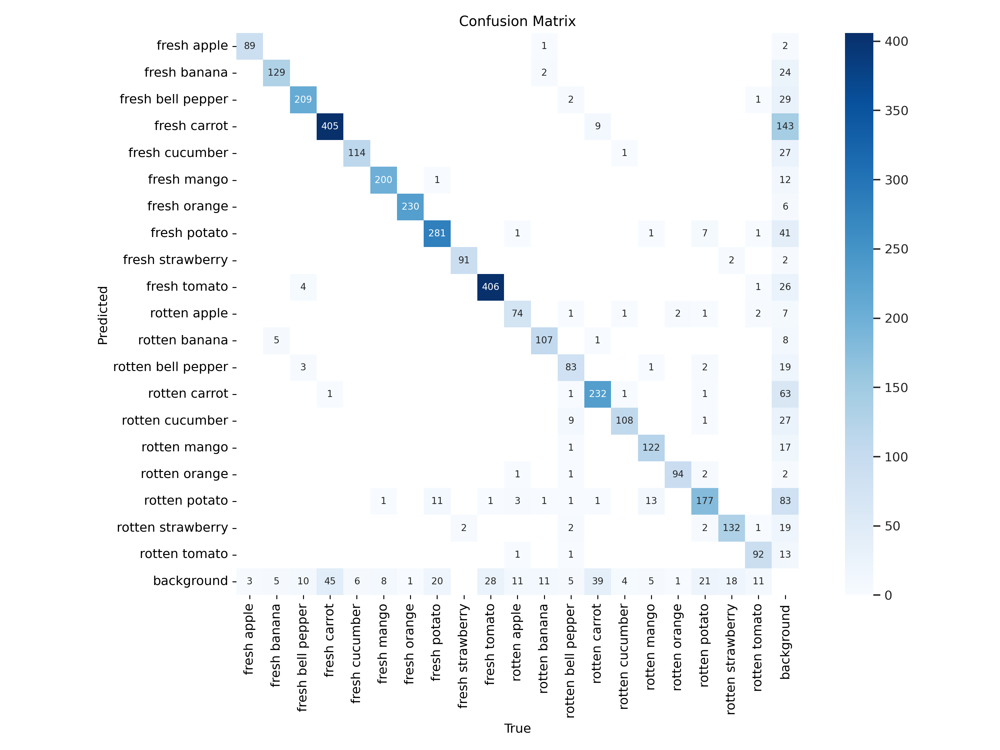

In [19]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train/confusion_matrix.png', width=600)

/content


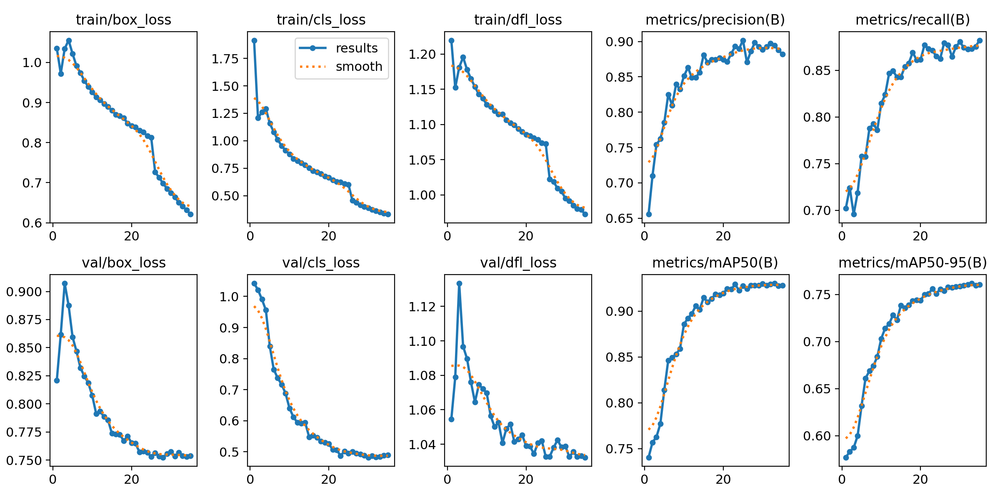

In [20]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train/results.png', width=600)

In [24]:
# prompt: mou nt drive

from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [25]:
import os
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')

# Define the save path
save_dir = "/content/drive/MyDrive/freshness_detection_models"
os.makedirs(save_dir, exist_ok=True)  # Create the directory if it does not exist

# Copy trained model to Google Drive
!cp runs/detect/train/weights/best.pt {save_dir}/final_model.pt

print(f"Model saved successfully at: {save_dir}/final_model.pt")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Model saved successfully at: /content/drive/MyDrive/freshness_detection_models/final_model.pt


Image downloaded successfully: /content/test_image.jpg

image 1/1 /content/test_image.jpg: 192x256 1 fresh apple, 1 rotten apple, 8.4ms
Speed: 1.0ms preprocess, 8.4ms inference, 1.5ms postprocess per image at shape (1, 3, 192, 256)


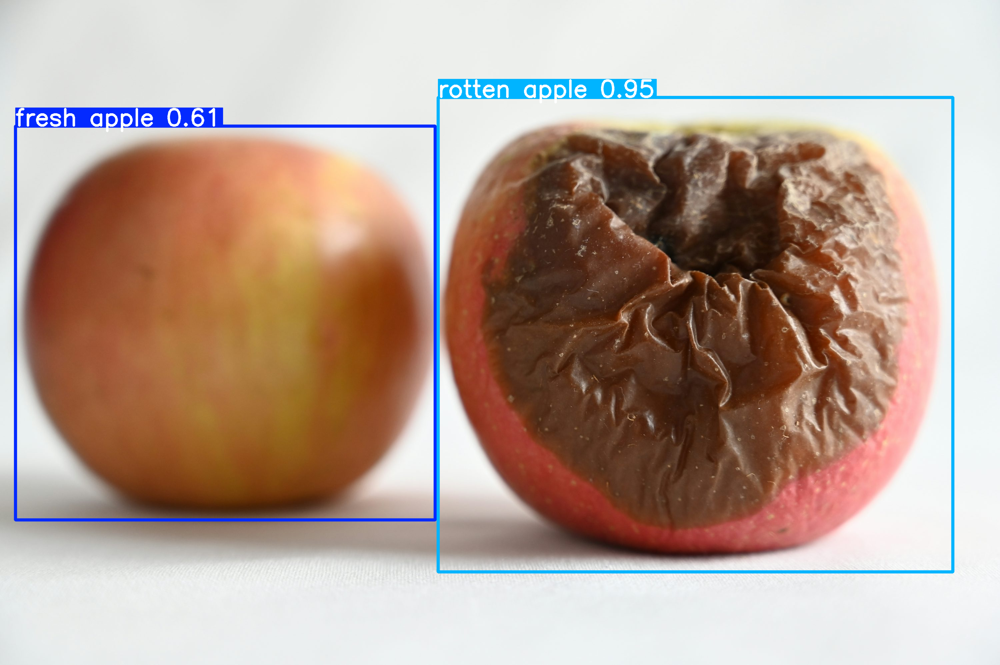

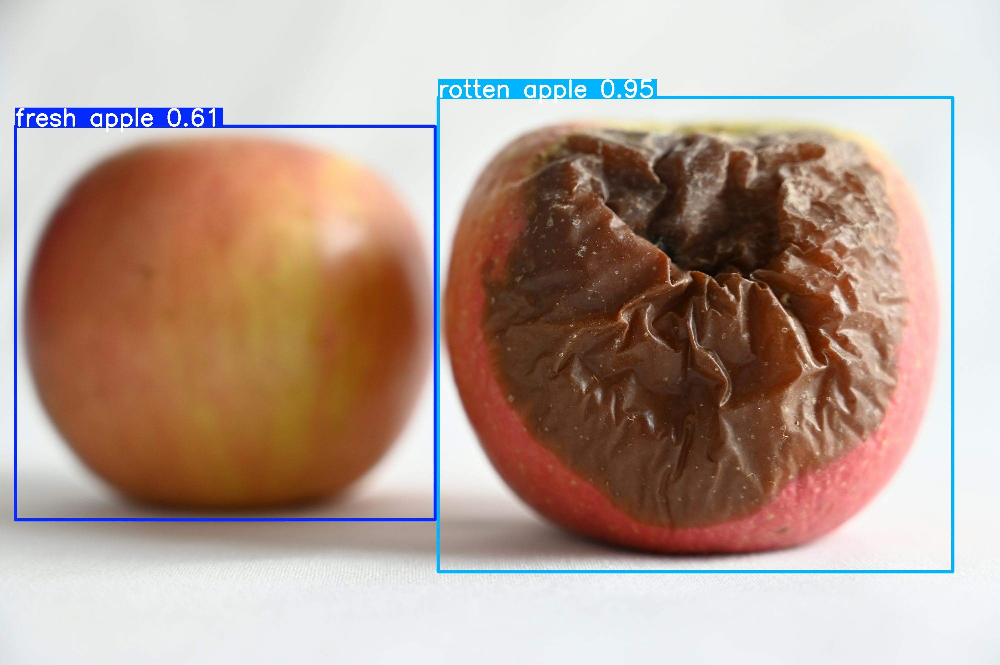

In [31]:
import torch
from ultralytics import YOLO
from PIL import Image
import requests
from IPython.display import display

# Load the trained YOLOv8 model
model_path = "/content/drive/MyDrive/freshness_detection_models/final_model.pt"
model = YOLO(model_path)

# Download an image from the internet
image_url = "https://images.unsplash.com/photo-1619687483931-ede874e1ef8c?fm=jpg&q=60&w=3000&ixlib=rb-4.0.3&ixid=M3wxMjA3fDB8MHxzZWFyY2h8Mnx8cm90dGVuJTIwYXBwbGV8ZW58MHx8MHx8fDA%3D"
image_path = "/content/test_image.jpg"

# Save the image locally
response = requests.get(image_url, stream=True)
if response.status_code == 200:
    with open(image_path, "wb") as file:
        file.write(response.content)
    print(f"Image downloaded successfully: {image_path}")
else:
    print("Failed to download image")

# Run inference
results = model(image_path)

# Show and save results
results[0].show()
results[0].save("output.jpg")


output_image = Image.open("output.jpg")
display(output_image)


/content


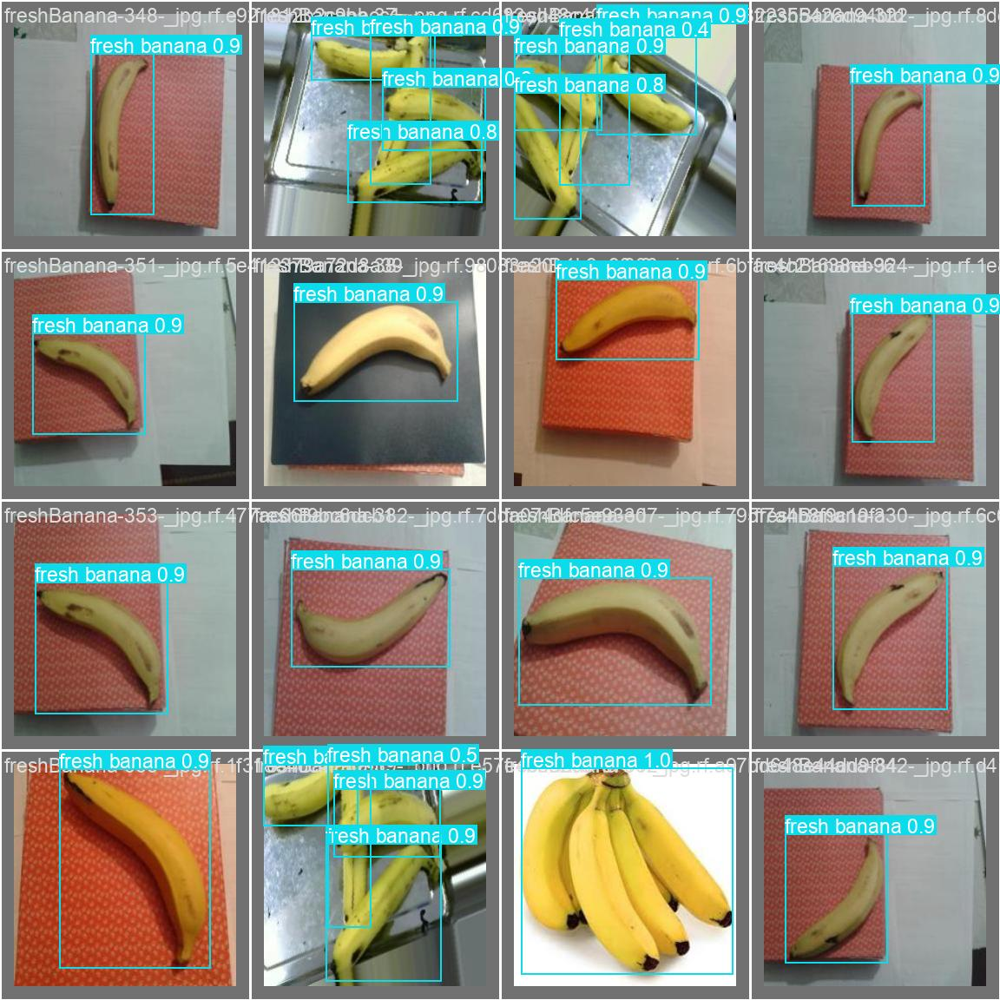

In [26]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train/val_batch2_pred.jpg', width=600)

## Validate Custom Model

In [21]:
%cd {HOME}

!yolo task=detect mode=val model={HOME}/runs/detect/train/weights/best.pt data={dataset.location}/data.yaml

/content
Ultralytics 8.3.100 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 11,133,324 parameters, 0 gradients, 28.5 GFLOPs
val: Scanning /content/freshness-detection-3/valid/labels.cache... 1717 images, 1 backgrounds, 0 corrupt: 100% 1717/1717 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 108/108 [00:10<00:00, 10.53it/s]
                   all       1717       3740      0.894      0.873       0.93      0.762
           fresh apple         39         92      0.962      0.967      0.961      0.864
          fresh banana        103        139      0.888      0.899      0.945      0.728
     fresh bell pepper         86        226      0.905      0.925      0.967      0.841
          fresh carrot         91        451      0.831      0.816      0.875      0.585
        fresh cucumber         50        120       0.85      0.925      0.949      0.713
           fresh mango    

## Inference with Custom Model

In [22]:
%cd {HOME}
!yolo task=detect mode=predict model={HOME}/runs/detect/train/weights/best.pt conf=0.25 source={dataset.location}/test/images save=True

/content
Ultralytics 8.3.100 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 11,133,324 parameters, 0 gradients, 28.5 GFLOPs

image 1/857 /content/freshness-detection-3/test/images/freshApple-1-_jpg.rf.379a337d635f57ff895bc4e1f2fa7bde.jpg: 256x256 1 fresh apple, 7.6ms
image 2/857 /content/freshness-detection-3/test/images/freshApple-148-_jpg.rf.5af0e7c940cad37ed59be692fbef409c.jpg: 256x256 1 fresh apple, 8.5ms
image 3/857 /content/freshness-detection-3/test/images/freshApple-163-_jpg.rf.65c7b36adfb354087aae71c3b50b58c1.jpg: 256x256 1 fresh apple, 7.9ms
image 4/857 /content/freshness-detection-3/test/images/freshApple-187-_jpg.rf.b605f83906bcda59bb4eaa677cf8e5e1.jpg: 256x256 5 fresh apples, 11.2ms
image 5/857 /content/freshness-detection-3/test/images/freshApple-200-_jpg.rf.c6c04bbbef620f0750baa89bdd75dd15.jpg: 256x256 1 fresh apple, 7.9ms
image 6/857 /content/freshness-detection-3/test/images/freshApple-208-_jpg.rf.10e76edc8a97138da0c49f

**NOTE:** Let's take a look at few results.

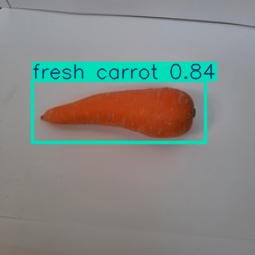

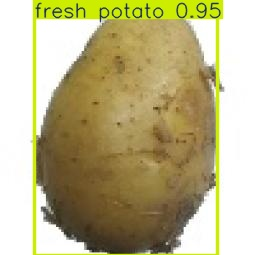

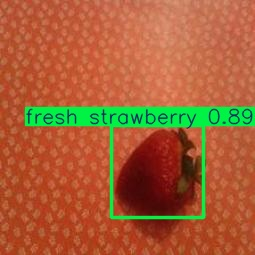

In [23]:
import glob
from IPython.display import Image, display

# Define the base path where the folders are located
base_path = '/content/runs/detect/'

# List all directories that start with 'predict' in the base path
subfolders = [os.path.join(base_path, d) for d in os.listdir(base_path)
              if os.path.isdir(os.path.join(base_path, d)) and d.startswith('predict')]

# Find the latest folder by modification time
latest_folder = max(subfolders, key=os.path.getmtime)

image_paths = glob.glob(f'{latest_folder}/*.jpg')[:3]

# Display each image
for image_path in image_paths:
    display(Image(filename=image_path, width=600))
    print("\n")